# Introduction
In this note book i use julia to examine the quality of the meanfield approximation for the lotka volterra system:
\begin{align}
    \frac{dC_i}{dt} = C_i (r_i - \alpha_i C_i - \sum_{i \neq j}^N \alpha_{ij} C_j)
\end{align}
    
which is

\begin{align}
    \frac{dC}{dt} = C (r - \alpha C - \psi \bar{C})
\end{align}

In this approximation we basicly assume that interactions are relatively small such that they can be aggregated to their mean effects upon each other (as seen in the last term).

First I call some packages and set up the distributions to draw the parameters for the simulations from. 

In [71]:
using Pkg
Pkg.activate("..")
using OrdinaryDiffEq, Plots, Distributions, EcoFuncSim, LinearAlgebra

N_sp = 500
u0 = ones(N_sp)

u_r = Normal(20,10)
r  = rand(u_r,N_sp)

u_a_i = Normal(5.0,1)
# a_i  = ones(N_sp)
a_i  = rand(u_a_i,N_sp)

u_p = Normal(0.0,1)
p  = rand(u_p,N_sp);
# p = zeros(N_sp);

# Logistic growth
Here I experiment by considering a simple logistic growth model with no interactions:
\begin{align}
    \frac{dC_i}{dt} = C_i (r_i - \alpha_i C_i)
\end{align}

For simplicity I assume that intraspecifc interactions are equal to $1$. I look at the ability of the taylor series approximation (around the point $r = \bar{r}$) to predict the first two moments of biomass over time. The equations for these approximations are:

\begin{align}
  \mu_C(t) &= \frac{\mu_r C{\left (0 \right )} e^{\mu_r t}}{\mu_r + \alpha C{\left (0 \right )} e^{\mu_r t} - \alpha C{\left (0 \right )}} \\
  \sigma^2_C(t) &= \frac{\sigma_r^{2} \left(\mu_r^{2} t - \mu_r \alpha t C{\left (0 \right )} + \alpha C{\left (0 \right )} e^{\mu_r t} - \alpha C{\left (0 \right )}\right)^{2} C^{2}{\left (0 \right )} e^{2 \mu_r t}}{\left(\mu_r + \alpha C{\left (0 \right )} e^{\mu_r t} - \alpha C{\left (0 \right )}\right)^{4}}
\end{align}

In [72]:
tspan = (0.0,2.0)

function test_logistic(du,u,p,t)
    for i = 1:length(du)
        du[i] = u[i] * (p[i]  - 1*u[i])
    end
end

function logistic_mean(C0,r,t)
    top = r * C0 * exp(r*t)
    bot = C0 * exp(r*t) - C0 + r
    return(top/bot)
end

function logistic_var(C0,ur,sr,t)
    top = sr^2 * ((ur^2)*t - ur*t*C0 + C0*exp(ur*t) - C0)^2 * C0^2 * exp(2*ur*t)
    bot = (ur+C0*exp(ur*t))^4
    return(top/bot)
end

prob = ODEProblem(test_logistic,u0,tspan,r)
sol = solve(prob,Rosenbrock23())

app_mean = logistic_mean.(mean(u0),u_r.μ,sol.t)
app_var = logistic_var.(mean(u0),u_r.μ,u_r.σ,sol.t)

l = @layout [a b c]
plop = plot(layout=l,size = (900, 400))

plot!(plop[1],sol,layout = l,legend=false,title = "Real Sim",colour = "black",alpha=0.2)
plot!(plop[1],sol.t,map(mean,sol(sol.t).u),color="red",alpha=1,line=(2))

plot!(plop[2],sol.t,app_mean,legend=:bottomright,label=["Actual mean","Approx mean"],title = "Mean Approximation")
plot!(plop[2],sol.t,map(mean,sol(sol.t).u),label=["Actual mean","Approx mean"])

plot!(plop[3],sol.t,app_var,legend=:bottomright,label=["Actual var","Approx var"],title = "Varience Approximation")
plot!(plop[3],sol.t,map(var,sol(sol.t).u),label=["Actual var","Approx var"])

So it looks like the taylor series approximations are pretty good here. Note that these approximations should become less good as the varience and higher moments of the parameter distriutions increase.

# A Multispecies Model
Here is the bulk of this notebook. Here i look at the quality of the mean field approximation outlined above. The figure below shows the results of a single simulation and the equivilant meanfield approximation. 

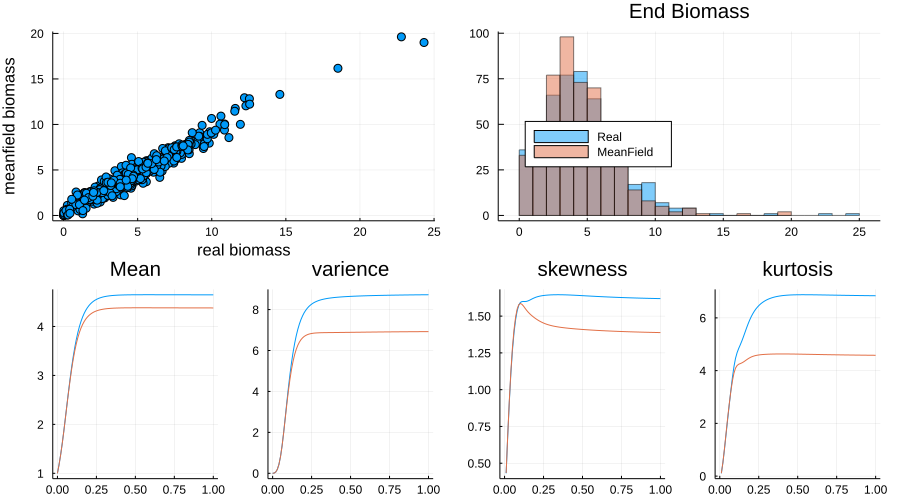

In [73]:
U = r
R = zeros(N_sp)
u_a = Normal(u_p.μ,sqrt((u_p.σ^2)/N_sp))
a = rand(u_a,N_sp,N_sp)
a[diagind(a)] = a_i
a = Array(Symmetric(a))

P = make_params(U,R,a,intra = true)
tend = 1.0
sol_real = simulate(u0,P,t_end = tend)
sol_mean = mean_simulate(u0,P,t_end = tend)

l = @layout [ a  b ; [c d e f]]
plop = plot(layout=l,size = (800, 500))
label = ["Real","MeanField"]

scatter!(plop[1],sol_real[end],sol_mean[end],legend=false,xaxis="real biomass",yaxis="meanfield biomass")

histogram!(plop[2],sol_real[end],alpha=0.5,label=label,title="End Biomass",legend=:bottomleft)
histogram!(plop[2],sol_mean[end],alpha=0.5,label=label)

t = range(0,stop=tend,length=100)

#means
ur = [mean(sol_real(i)) for i in t]
um = [mean(sol_mean(i)) for i in t]

plot!(plop[3],t,ur,title="Mean",legend = false)
plot!(plop[3],t,um)

#var

vr = [var(sol_real(i)) for i in t]
vm = [var(sol_mean(i)) for i in t]

plot!(plop[4],t,vr,title="varience",legend = false)
plot!(plop[4],t,vm)


#skew

vr = [skewness(sol_real(i)) for i in t]
vm = [skewness(sol_mean(i)) for i in t]

plot!(plop[5],t,vr,title="skewness",legend = false)
plot!(plop[5],t,vm)

#kurt
vr = [kurtosis(sol_real(i)) for i in t]
vm = [kurtosis(sol_mean(i)) for i in t]

plot!(plop[6],t,vr,title="kurtosis",legend = false)
plot!(plop[6],t,vm)

We can see that the meanfield approach is fairly good across the first 4 moments of the biomass distribution. This looks to be especialy true in the exponential phase which we are interested In. What about with some mixed interactions (still symetrical strength)?

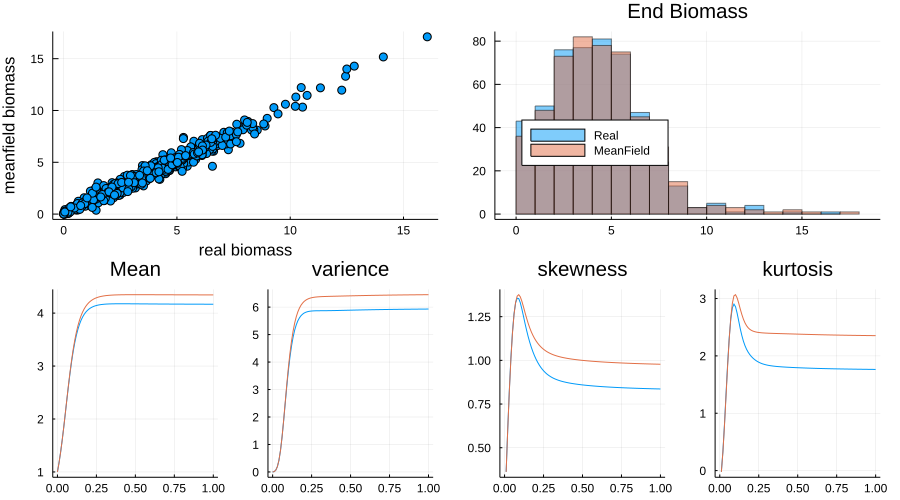

In [74]:
u_a = Normal(u_p.μ/N_sp,sqrt((u_p.σ^2)/N_sp)) #strength
a = rand(u_a,N_sp,N_sp)
a = Array(Symmetric(a))
a[diagind(a)] = a_i
for row = 1:N_sp-1
    for col = row+1 : N_sp
        if a[row,col] < 1
            a[col,row] = -a[row,col] 
        end
    end
end
a
P = make_params(U,R,a,intra = true)
tend = 1.0
sol_real = simulate(u0,P,t_end = tend)
sol_mean = mean_simulate(u0,P,t_end = tend)

l = @layout [ a  b ; [c d e f]]
plop = plot(layout=l,size = (900, 500))
label = ["Real","MeanField"]

scatter!(plop[1],sol_real[end],sol_mean[end],legend=false,xaxis="real biomass",yaxis="meanfield biomass")

histogram!(plop[2],sol_real[end],alpha=0.5,label=label,title="End Biomass",legend=:bottomleft)
histogram!(plop[2],sol_mean[end],alpha=0.5,label=label)

t = range(0,stop=tend,length=100)

#means
ur = [mean(sol_real(i)) for i in t]
um = [mean(sol_mean(i)) for i in t]

plot!(plop[3],t,ur,title="Mean",legend = false)
plot!(plop[3],t,um)

#var

vr = [var(sol_real(i)) for i in t]
vm = [var(sol_mean(i)) for i in t]

plot!(plop[4],t,vr,title="varience",legend = false)
plot!(plop[4],t,vm)


#skew

vr = [skewness(sol_real(i)) for i in t]
vm = [skewness(sol_mean(i)) for i in t]

plot!(plop[5],t,vr,title="skewness",legend = false)
plot!(plop[5],t,vm)

#kurt
vr = [kurtosis(sol_real(i)) for i in t]
vm = [kurtosis(sol_mean(i)) for i in t]

plot!(plop[6],t,vr,title="kurtosis",legend = false)
plot!(plop[6],t,vm)

In [75]:
a_i

500-element Array{Float64,1}:
 6.599143663808156 
 1.725022646862406 
 6.226607293201762 
 5.619016733663981 
 3.802931534780302 
 4.611374834046044 
 3.6328300749704683
 4.775595101805369 
 3.85048298401645  
 4.616743176812079 
 5.479181162410329 
 4.635278491078127 
 6.016601962282378 
 ⋮                 
 5.126511254642504 
 2.547604202132438 
 2.6928645599071586
 3.965788965988072 
 4.984517718170933 
 5.983794057561727 
 3.588811893854216 
 6.5825916788764545
 6.091948863680804 
 5.149424365768676 
 4.40471667342318  
 6.273296258811547 

In [76]:
function mean_approx(du,u,p,t)
    du[1] = u[1] * (p[1] - u[1]*p[2] - u[1]*p[3])
    u2 = u[1]^2
    du[2] = u2 * (p[4] + u2*p[5] + u2*p[6]) + (u[2]^2*(-p[1] + 2*p[2]*u[1] + p[3]*u[1])^2)
end

prob = ODEProblem(mean_approx,[mean(u0),var(u0)],(0.0,tend),[u_r.μ,u_a_i.μ,u_p.μ,
                                                     u_r.σ,u_a_i.σ,u_p.σ])
sol = solve(prob,Rosenbrock23())

plot(t,ur,legend=:bottomright,label=["real","meanfield","approximation"])
plot!(t,um,label=["real","meanfield","approximation"])
plot!(sol,label=["real","meanfield","approximation"])

┌ Warning: dt <= dtmin. Aborting. This is often an indicator that the differential equation is unstable or there is an error in the model specification. If you would like to force continuation with dt=dtmin, set force_dtmin=true
└ @ DiffEqBase /Users/Tom/.julia/packages/DiffEqBase/8usQ9/src/integrator_interface.jl:156


BoundsError: BoundsError: attempt to access 3-element Array{String,1} at index [4]

In [ ]:
function mean_approx(du,u,p,t)
    du[1] = u[1] * (p[1] - u[1]*p[2] - u[1]*p[3])
end

prob = ODEProblem(mean_approx,[mean(u0)],tspan,[u_r.μ,u_a_i.μ,u_p.μ])
sol = solve(prob,Rosenbrock23())

plot(t,ur)
plot!(t,um)
plot!(sol)

In [ ]:
Just as a quick tes what does $cov(\alpha_{ij},C_j)$ look like?

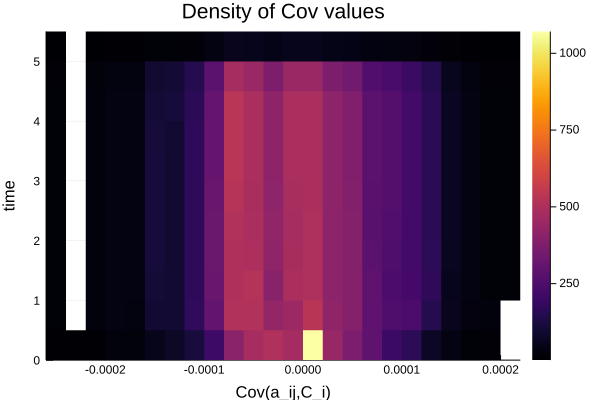

In [128]:
f(x,t) = cov(sol_real(t)[deleteat!(collect(1:N_sp),x)],P.Com.a[x,deleteat!(collect(1:N_sp),x)])
twoD = Array{Float64,2}(undef,500,100)
for i = 1:100
twoD[:,i] = f.(1:500,range(0,stop=5,length=100)[i])
end
histogram2d(vcat(twoD...),repeat(range(0,stop=5,length=100),inner = N_sp),
    title = "Density of Cov values",xaxis="Cov(a_ij,C_i)",yaxis="time")

So it looks like in this simulation there is relatively little covarience beteween interaction parameters the biomass densities of con-specifics.

In [39]:
#generate parameters
function generate_parameters(N_sp,ur,sr,ua,sa,up,sp)
    u_r = Normal(ur,sr)
    r  = rand(u_r,N_sp)

    u_a_i = Normal(ua,sa)
    a_i  = rand(u_a_i,N_sp)
    
    u_a = Normal(u_p.μ/N_sp,u_p.σ/N_sp)
    a = rand(u_a,N_sp,N_sp)
    a[diagind(a)] = a_i
    a = Array(Symmetric(a))
    
    P = make_params(r,zeros(N_sp),a,intra = true)
    return(P)
end



#loss function
function sim_loss(u0,P;t_end = tend)
    loss = Vector{Float64}(undef,4)
    t = range(0.01,stop=tend,length=100)

    #simulate
    sol_real = simulate(u0,P,t_end = t_end)
    sol_mean = mean_simulate(u0,P,t_end = t_end)
    
    #means
    r = [mean(sol_real(i)) for i in t]
    m = [mean(sol_mean(i)) for i in t]
    loss[1] = sum(abs2.(r .- m))

    #var
    r = [var(sol_real(i)) for i in t]
    m = [var(sol_mean(i)) for i in t]
    loss[2] = sum(abs2.(r .- m))

    #skew
    r = [skewness(sol_real(i)) for i in t]
    m = [skewness(sol_mean(i)) for i in t]
    loss[3] = sum(abs2.(r .- m))

    #kurt
    r = [kurtosis(sol_real(i)) for i in t]
    m = [kurtosis(sol_mean(i)) for i in t]
    loss[4] = sum(abs2.(r .- m))

    
    return(loss)
end


sim_loss (generic function with 1 method)

In [40]:
loss_sim = Array{Float64,3}(undef,25,10,4)
r_vec = range(100,stop=125.0,length=10)
for j = 1:10
    println(r_vec[j])
    for i = 1:25
        N_sp = 100
        u0 = ones(N_sp)
        P  = generate_parameters(N_sp,r_vec[j],10.0,1.0,0.1,10.0,0.1)
        tend = 10.0
        loss_sim[i,j,:] = sim_loss(u0,P;t_end = tend)
    end
end

100.0
102.77777777777777
105.55555555555556
108.33333333333333
111.11111111111111
113.88888888888889
116.66666666666667
119.44444444444444
122.22222222222223
125.0


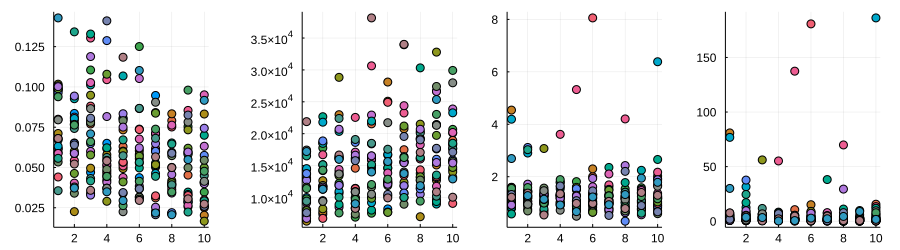

In [41]:
l = @layout [a b c d]
plop = plot(layout=l,size = (900, 250),legend=false)

scatter!(plop[1],loss_sim[:,:,1]')
scatter!(plop[2],loss_sim[:,:,2]')
scatter!(plop[3],loss_sim[:,:,3]')
scatter!(plop[4],loss_sim[:,:,4]')

In [42]:
loss_sim = Array{Float64,3}(undef,10,10,4)
a_vec = range(0.5,stop=1.5,length=10)
for j = 1:10
    print(j)
    for i = 1:10
        N_sp = 100
        u0 = ones(N_sp)
        P  = generate_parameters(N_sp,20.0,1.0,a_vec[j],0.1,1.0,0.1)
        tend = 10.0
        loss_sim[i,j,:] = sim_loss(u0,P;t_end = tend)
    end
end

12345678910

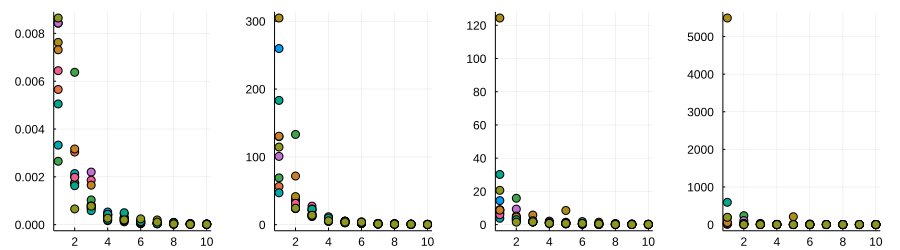

In [43]:
l = @layout [a b c d]
plop = plot(layout=l,size = (900, 250),legend=false)

scatter!(plop[1],loss_sim[:,:,1]')
scatter!(plop[2],loss_sim[:,:,2]')
scatter!(plop[3],loss_sim[:,:,3]')
scatter!(plop[4],loss_sim[:,:,4]')

In [44]:
loss_sim = Array{Float64,3}(undef,10,10,4)
p_vec = range(0.0,stop=10.0,length=10)
for j = 1:10
    print(j)
    for i = 1:10
        N_sp = 100
        u0 = ones(N_sp)
        P  = generate_parameters(N_sp,15.0,1.0,1.0,0.1,p_vec[j],0.1)
        tend = 10.0
        loss_sim[i,j,:] = sim_loss(u0,P;t_end = tend)
    end
end

12345678910

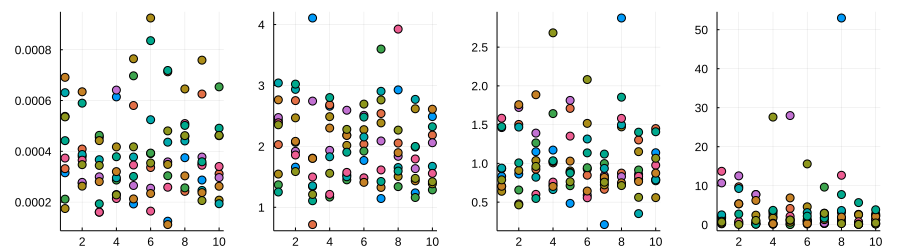

In [45]:
l = @layout [a b c d]
plop = plot(layout=l,size = (900, 250),legend=false)

scatter!(plop[1],loss_sim[:,:,1]')
scatter!(plop[2],loss_sim[:,:,2]')
scatter!(plop[3],loss_sim[:,:,3]')
scatter!(plop[4],loss_sim[:,:,4]')

So the approximation is fairly good across a range of parameter values. I expect it would be when the assumptions of the meanfield approach are chalenged that we see a difference (i.e when interaction strengths are more skewed such that $cov(\alpha_{ij},C_i)$ cannot be ignored).

In [32]:
sol_real[end][1]

10.759456011153215

In [47]:
P

EcoFuncSim.Parameters(Community([16.4401, 14.6652, 15.0735, 16.018, 15.4914, 14.4107, 13.329, 14.8103, 15.9308, 14.6455  …  14.4223, 15.3526, 14.1231, 15.032, 16.6937, 15.6216, 16.542, 16.0912, 15.0997, 14.8819], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0  …  0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.993381 0.0983105 … 0.100266 0.0973093; 0.0983105 0.994423 … 0.0983349 0.0978977; … ; 0.100266 0.0983349 … 0.85666 0.0972069; 0.0973093 0.0978977 … 0.0972069 1.02133]), 100)

## Mean Model

In [80]:
param = [[mean(r),moment(r,2,0)],[mean(a_i),moment(a_i,2,0)],[mean(p),moment(p,2,0)]]
tspan = (0.0,tend)
function test_mean_app(du,u,p,t)
        du[1] = u[1] * (p[1][1] - u[1] * p[2][1] - u[1] * p[3][1])
        du[2] = 2*u[2]*p[1][1] - 2*u[1]*u[2]*p[2][1] - 2*u[1]*u[2]*p[3][1]
end

prob = ODEProblem(test_mean_app,[mean(u0),moment(u0,2,0)],tspan,param)
sol_mean_app = solve(prob,Rosenbrock23())
# plot(sol_real,colour="black",alpha=0.2,legend=false)
# plot!(sol_mean_app)
1

1

# Going overkill 
Lets try symbolic regression to learn the system! Lets start with a simple test and take the results of the logistic growth equation:

\begin{align}
    \frac{dC_i}{dt} = C_i (r_i - C_i)
\end{align}

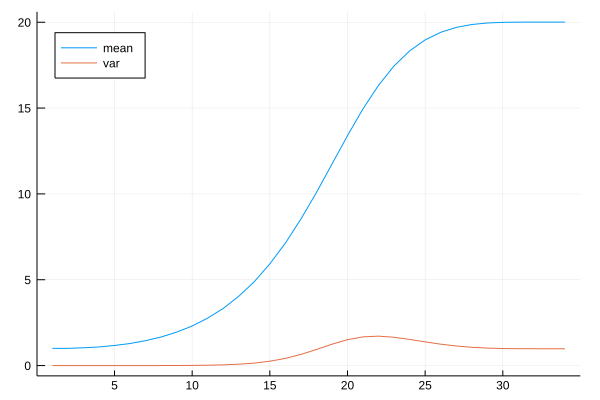

In [189]:
using ExprOptimization, Random, TreeView
mean_log = [mean(sol.u[i]) for i in 1:length(sol.u)]
var_log = [var(sol.u[i]) for i in 1:length(sol.u)]

plot(mean_log,label=["mean","var"],legend=:topleft)
plot!(var_log,label=["mean","var"])

These are generated from a distribution of growth rates and as such ee want to be able to recover equations describing them given the first two moments of $r$. First we lay out the grammar (the possible opperations that describe the dynamics).

In [297]:
const grammar = @grammar begin
    R = t_
    R = u_r_u
    R = u_r_s
    R = R + R
    R = R - R
    R = R * R
    R = R / R
    R = exp(R)
#     R = log(R)
end
const S = SymbolTable(grammar)
S[:u_r_u] = u_r.μ
S[:u_r_s] = u_r.σ

1.0

We then describe the loss function 

In [298]:
function loss(tree::RuleNode, grammar::Grammar)
    ex = get_executable(tree, grammar)
    loss = 0.0
    for t = 1:length(sol.u)
    S[:t_] = sol.t[t]
        loss += abs2(Core.eval(S,ex) - mean_log[t])
    end
    loss
end

loss (generic function with 1 method)

In [312]:
Random.seed!(1)
p = GeneticProgram(1000,100,6,0.3,0.3,0.4)
results_gp = optimize(p, grammar, :R, loss)
(results_gp.expr, results_gp.loss)

(:(((u_r_u * t_ + u_r_s) - (u_r_s + u_r_s) / (u_r_u / t_ - exp(u_r_s))) * (u_r_u / ((t_ * u_r_u + u_r_s / t_) - u_r_s / exp(t_ - u_r_s)))), 17.295994706280304)

In [310]:
results_gp.expr

:(((u_r_u * t_ + u_r_s) - (u_r_s + u_r_s) / (u_r_u / t_ - exp(u_r_s))) * (u_r_u / ((t_ * u_r_u + u_r_s / t_) - u_r_s / exp(t_ - u_r_s))))

$
(( (\mu_{r}t + \sigma_{r}- \frac{\sigma_{r} + \sigma_{r}}{\mu_{r} / t - exp(\sigma_{r})} ) (\mu_{r} / ((t \mu_{r} + \sigma_{r} / t) - \sigma_{r} / exp(t - \sigma_{r}))))
$

In [92]:
# #define grammar
# const grammar = @grammar begin
#     Real = x
#     Real = Real * Real
#     Real = Real + Real
#     Real = Real - Real
#     Real = exp(Real)
# end

LoadError: syntax: invalid identifier name "?"

In [8]:
function sim(N_sp::Int64,Nsim::Int64,a_min::Float64,a_max::Float64)
    #define parameters
    u0 = ones(N_sp)
    #growth
    u_r = Normal(1,0.1)
    r  = rand(u_r,N_sp)
    #intra
    a_i = ones(N_sp)
    
    result = Array{Float64,3}(undef,500,Nsim,2)
    a_ratio = range(a_min,stop = a_max,length = Nsim)
    t = range(0,stop=100,length = 500)
    
    for i  = 1:Nsim
        #inter
        u_p = Normal(a_ratio[i], 0.1)
        p = rand(u_p,N_sp)
        println(u_p.μ)
        #for real sims
        u_a = Normal(u_p.μ/N_sp,u_p.σ/N_sp)
        a = rand(u_a,N_sp,N_sp)

        P_real = make_params(U,R,a,intra = false)
        P_approx = param = [[mean(r),moment(r,2,0)],[mean(a_i),moment(a_i,2,0)],[mean(p),moment(p,2,0)]]
        
        sol_real = simulate(u0,P_real,t_end = 100.0)
        
        prob = ODEProblem(test_mean_app,[mean(u0)],(0.0,100.0),P_approx)
        sol_mean_app = solve(prob,Rosenbrock23())
        
        result[:,i,1] = mean.(sol_real(t).u)
        result[:,i,2] = hcat(sol_mean_app(t).u...)
        
    end
    
    return(result)

end

    

sim (generic function with 1 method)

0.1
12.575
25.05
37.525
50.0


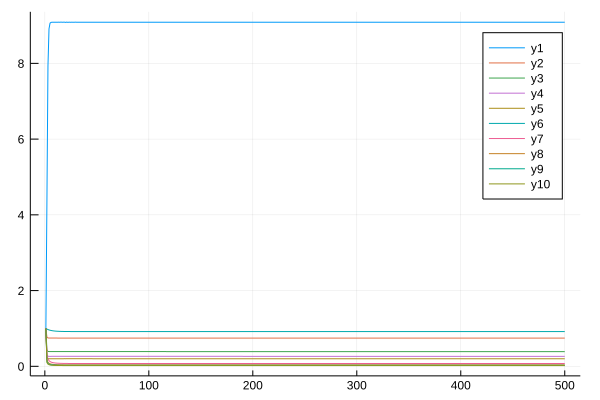

In [9]:
sol = sim(100,5,0.1,50.0)

plot(sol[:,:,1])
plot!(sol[:,:,2])

In [633]:
sol_mean_app(t).u

100-element Array{Array{Float64,1},1}:
 [1.0]     
 [0.842814]
 [0.746777]
 [0.683055]
 [0.638573]
 [0.606244]
 [0.582121]
 [0.563844]
 [0.549741]
 [0.538637]
 [0.529994]
 [0.523039]
 [0.517582]
 ⋮         
 [0.494428]
 [0.494428]
 [0.494428]
 [0.494428]
 [0.494428]
 [0.494428]
 [0.494428]
 [0.494428]
 [0.494428]
 [0.494428]
 [0.494428]
 [0.494428]

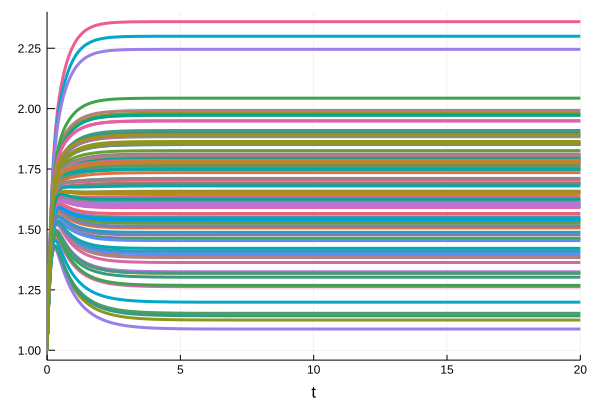

In [11]:
tspan = (0.0,20.0)
function test_mean(du,u,p,t)
    for i=1:length(du)
        du[i] = u[i] *(p[1][i] - p[2][i]*u[i] - p[3][i]*mean(u))
    end
end

prob = ODEProblem(test_mean,u0,tspan,[r,a_i,p])
sol = solve(prob,Rosenbrock23());
plot(sol,legend=false)